<a href="https://colab.research.google.com/github/SoulOfWindTGN/Pattern_Recognition_Demo/blob/main/notebooks/Color_histogram_Hu_Moments__Haralick_Texture.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -q kaggle
!pip install mahotas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 5.7 MB 3.8 MB/s 


In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"homyhanh","key":"15a9c5cf53243dcf4df48946918d0fb6"}'}

In [ ]:
!mkdir ~/.kaggle
!touch /root/.kaggle/kaggle.json
! chmod 600 /root/.kaggle/kaggle.json
! echo '{"username":"homyhanh","key":"15a9c5cf53243dcf4df48946918d0fb6"}' > ~/.kaggle/kaggle.json

In [ ]:
!kaggle competitions download -c classification-of-plants-of-southeast-asia

100% 3.81G/3.81G [01:53<00:00, 62.1MB/s]
100% 3.81G/3.81G [01:53<00:00, 36.0MB/s]


In [ ]:
!unzip classification-of-plants-of-southeast-asia.zip

Streaming output truncated to the last 5000 lines.
  inflating: bali-26_train/bali-26_train/vanilla/36609.jpg  
  inflating: bali-26_train/bali-26_train/vanilla/36610.jpg  
  inflating: bali-26_train/bali-26_train/vanilla/36611.jpg  
  inflating: bali-26_train/bali-26_train/vanilla/36612.jpg  
  inflating: bali-26_train/bali-26_train/vanilla/36613.jpg  
  inflating: bali-26_train/bali-26_train/vanilla/36614.jpg  
  inflating: bali-26_train/bali-26_train/vanilla/36615.jpg  
  inflating: bali-26_train/bali-26_train/vanilla/36616.jpg  
  inflating: bali-26_train/bali-26_train/vanilla/36617.jpg  
  inflating: bali-26_train/bali-26_train/vanilla/36618.jpg  
  inflating: bali-26_train/bali-26_train/vanilla/36619.jpg  
  inflating: bali-26_train/bali-26_train/vanilla/36620.jpg  
  inflating: bali-26_train/bali-26_train/vanilla/36621.jpg  
  inflating: bali-26_train/bali-26_train/vanilla/36622.jpg  
  inflating: bali-26_train/bali-26_train/vanilla/36623.jpg  
  inflating: bali-26_train/bali-26

In [ ]:
import os
import pandas as pd
import json
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import matplotlib.pyplot as plt
import mahotas
from sklearn.utils import shuffle
from sklearn.svm import SVC
import joblib
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.model_selection import train_test_split

In [ ]:
path_train = '/content/bali-26_train/bali-26_train'

In [ ]:
plants = sorted (os.listdir(path_train))
plants

['bamboo',
 'banana',
 'cacao',
 'cinnamon',
 'coffeearabica',
 'dragonfruit',
 'durian',
 'frangipani',
 'guava',
 'jackfruit',
 'lychee',
 'mango',
 'mangosteen',
 'nilam',
 'papaya',
 'passiflora',
 'sawo',
 'snakefruit',
 'starfruit',
 'sugarpalm',
 'suweg',
 'taro',
 'vanilla',
 'waterguava',
 'whitepepper',
 'zodia']

In [ ]:
n = []
for plant in plants:
  num_im = os.path.join (path_train, plant)
  num = len(os.listdir(num_im))
  n.append (num)
  print ('Number of ' + plant + ':', num)

Number of bamboo: 1925
Number of banana: 1716
Number of cacao: 1682
Number of cinnamon: 1224
Number of coffeearabica: 1341
Number of dragonfruit: 2109
Number of durian: 2437
Number of frangipani: 1567
Number of guava: 1931
Number of jackfruit: 2670
Number of lychee: 1116
Number of mango: 1343
Number of mangosteen: 1624
Number of nilam: 1242
Number of papaya: 1645
Number of passiflora: 1355
Number of sawo: 1222
Number of snakefruit: 1167
Number of starfruit: 1705
Number of sugarpalm: 1256
Number of suweg: 1191
Number of taro: 1588
Number of vanilla: 1957
Number of waterguava: 1849
Number of whitepepper: 1409
Number of zodia: 1336


In [ ]:
data = pd.DataFrame({'Name': plants, 'Number': n})
data

,Name,Number
0,bamboo,1925
1,banana,1716
2,cacao,1682
3,cinnamon,1224
4,coffeearabica,1341
5,dragonfruit,2109
6,durian,2437
7,frangipani,1567
8,guava,1931
9,jackfruit,2670


In [ ]:
data.describe()

,Number
count,26.000000
mean,1600.269231
std,398.162837
min,1116.000000
25%,1276.000000
50%,1577.500000
75%,1815.750000
max,2670.000000


In [ ]:
fixed_size = tuple((100, 100))
bins = 8

In [ ]:
def fd_histogram(image, mask=None):
    # convert the image to HSV color-space
    image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    # compute the color histogram
    hist  = cv2.calcHist([image], [0, 1, 2], None, [bins, bins, bins], [0, 256, 0, 256, 0, 256])
    # normalize the histogram
    cv2.normalize(hist, hist)
    # return the histogram
    return hist.flatten()

In [ ]:
# feature-descriptor-1: Hu Moments
def fd_hu_moments(image):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    feature = cv2.HuMoments(cv2.moments(image)).flatten()
    return feature

In [ ]:
# feature-descriptor-2: Haralick Texture
def fd_haralick(image):
    # convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # compute the haralick texture feature vector
    haralick = mahotas.features.haralick(gray).mean(axis=0)
    # return the result
    return haralick

In [ ]:
X = []
y = []

In [ ]:
def model (num_im, image):
  im = cv2.imread(os.path.join (num_im, image))
  im = cv2.resize(im, fixed_size)
  fv_hu_moments = fd_hu_moments(im)
  fv_haralick   = fd_haralick(im)
  fv_histogram  = fd_histogram(im)
  feature = np.hstack([fv_histogram, fv_hu_moments, fv_haralick])
  return feature

In [ ]:
for plant in plants:
  print ('+', plant)
  num_im = os.path.join (path_train, plant)
  for image in sorted(os.listdir(num_im)):
    feature = model (num_im, image)
    X.append (feature)
    y.append (plants.index(plant))
  print ('--------------------------------------------------------------------------------------')

+ bamboo
--------------------------------------------------------------------------------------
+ banana
--------------------------------------------------------------------------------------
+ cacao
--------------------------------------------------------------------------------------
+ cinnamon
--------------------------------------------------------------------------------------
+ coffeearabica
--------------------------------------------------------------------------------------
+ dragonfruit
--------------------------------------------------------------------------------------
+ durian
--------------------------------------------------------------------------------------
+ frangipani
--------------------------------------------------------------------------------------
+ guava
--------------------------------------------------------------------------------------
+ jackfruit
--------------------------------------------------------------------------------------
+ lychee
------------

In [ ]:
X

[array([ 1.58187374e-02,  1.05458256e-02,  2.37281080e-02,  6.06384985e-02,
         2.28053480e-01,  3.74816209e-01,  3.53724569e-01,  8.70030597e-02,
         1.05458256e-02,  3.82286161e-02,  6.45931810e-02,  1.25231683e-01,
         4.47758168e-01,  4.89062667e-01,  2.07840651e-01,  1.88946035e-02,
         1.05458256e-02,  4.78956252e-02,  7.20631406e-02,  1.29625767e-01,
         2.75509685e-01,  1.48520380e-01,  7.46995956e-03,  2.63645640e-03,
         7.90936872e-03,  2.10916512e-02,  2.98798382e-02,  2.02128328e-02,
         3.47133428e-02,  1.09852348e-02,  4.83350363e-03,  4.39409399e-04,
         3.07586580e-03,  6.59114122e-03,  2.63645640e-03,  3.07586580e-03,
         4.39409399e-04,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         4.83350363e-03,  8.78818799e-04,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         1.31822820e-03,  8.78818799e-04,  0.00000000e+00,  0.00000000e+00,
         0.0

In [ ]:
y

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,


Decision Tree


In [ ]:
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier()
clf = Pipeline([('scaler', StandardScaler()), ('decisiontree', clf)])

In [ ]:
clf.fit(X, y)


Pipeline(steps=[('scaler', StandardScaler()),
                ('decisiontree', DecisionTreeClassifier())])

In [ ]:
joblib.dump(clf, 'DecisionTree.pkl')

['DecisionTree.pkl']

In [ ]:
DecisionTree = joblib.load('DecisionTree.pkl')

Naive Bayes

In [ ]:
from sklearn.naive_bayes import GaussianNB
clf1 =  GaussianNB()
clf1 = Pipeline([('scaler', StandardScaler()), ('gnb', clf1)])

In [ ]:
clf1.fit(X, y)

Pipeline(steps=[('scaler', StandardScaler()), ('gnb', GaussianNB())])

In [ ]:
joblib.dump(clf1, 'NaiveBayes.pkl')

['NaiveBayes.pkl']

In [ ]:
NaiveBayes = joblib.load('NaiveBayes.pkl')

Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression
clf2 = LogisticRegression(random_state=0)
clf2 = Pipeline([('scaler', StandardScaler()), ('lr', clf2)])

In [ ]:
clf2.fit(X, y)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG,


Pipeline(steps=[('scaler', StandardScaler()),
                ('lr', LogisticRegression(random_state=0))])

In [ ]:
joblib.dump(clf2, 'LogisticRegression.pkl')

In [ ]:
LogisticRegression = joblib.load('LogisticRegression.pkl')

Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
clf3 = RandomForestClassifier(max_depth=2, random_state=0)
clf3 = Pipeline([('scaler', StandardScaler()), ('rf', clf3)])

In [ ]:
clf3.fit(X, y)

Pipeline(steps=[('scaler', StandardScaler()),
                ('rf', RandomForestClassifier(max_depth=2, random_state=0))])

In [ ]:
joblib.dump(clf3, 'RandomForest.pkl')

['RandomForest.pkl']

In [ ]:
RandomForest = joblib.load('RandomForest.pkl')

Predict

In [ ]:
map_label = {0: "bamboo", 1: "banana", 2: "cacao", 3: "cinnamon", 4: "coffeearabica",\
    5: "dragonfruit", 6: "durian", 7: "frangipani", 8: "guava", 9: "jackfruit", 10: "lychee",\
    11: "mango", 12: "mangosteen", 13: "nilam", 14: "papaya", 15: "passiflora", 16: "sawo", 17: "snakefruit",\
    18: "starfruit", 19: "sugarpalm", 20: "suweg", 21: "taro", 22: "vanilla", 23: "waterguava", 24: "whitepepper", 25: "zodia"}

In [ ]:
path_test = '/content/bali-26_test/bali-26_test'

In [ ]:
name_image = '1032.jpg'

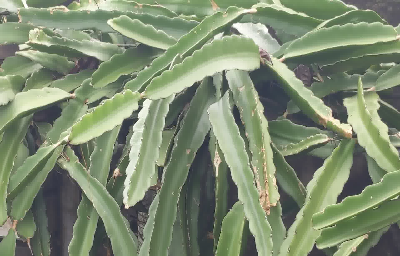

In [ ]:
path_image = os.path.join (path_test, name_image)
image = cv2.imread(path_image)
image = cv2.resize(image,(400,256))
cv2_imshow(image)

In [ ]:
pred = DecisionTree.predict (model(path_test, name_image).reshape (1, -1))

In [ ]:
map_label[pred[0]]

'dragonfruit'

In [ ]:
Images = []
Label = []

In [ ]:
for x in sorted(os.listdir(path_test)):
  pred = DecisionTree.predict (model(path_test, x).reshape (1, -1))
  label = map_label[pred[0]]
  Images.append(x)
  Label.append(label)

In [ ]:
result = pd.DataFrame({'id': Images, 'category': Label})

In [ ]:
result

,id,category
0,1.jpg,cacao
1,10.jpg,guava
2,100.jpg,guava
3,1000.jpg,waterguava
4,1001.jpg,mango
...,...,...
4619,995.jpg,vanilla
4620,996.jpg,guava
4621,997.jpg,zodia
4622,998.jpg,banana


In [ ]:
result.to_csv('LogisticRegression.csv',index=False)